# Advanced Computer Vision

## Exercise sheet 12

### Introduction

Depth estimation is a crucial step towards inferring scene geometry from 2D images. The goal in _monocular depth estimation_ is to predict the depth value of each pixel or inferring depth information, given only a single RGB image as input. This example will show an approach to build a depth estimation model with a convnet and simple loss functions.


In [1]:
# Importing libraries

import os
import sys

import tensorflow as tf

import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image

# tf.random.set_seed(123)

### Downloading the dataset

DIODE (Dense Indoor and Outdoor DEpth) is a dataset that contains diverse high-resolution color images with accurate, dense, far-range depth measurements. It is the first public dataset to include RGBD images of indoor and outdoor scenes obtained with one sensor suite.

In [2]:
%%time
annotation_folder = "/dataset/"
if not os.path.exists(os.path.abspath(".") + annotation_folder):
    annotation_zip = tf.keras.utils.get_file(
        "val.tar.gz",
        cache_subdir=os.path.abspath("."),
        origin="http://diode-dataset.s3.amazonaws.com/val.tar.gz",
        extract=True,
    )

2774625282/2774625282 ━━━━━━━━━━━━━━━━━━━━ 55s 0us/step
CPU times: user 35.1 s, sys: 14.5 s, total: 49.5 s
Wall time: 1min 56s


##  Preparing the dataset

We only use the indoor images to train our depth estimation model.

DIODE Depth includes RGB images, Depth maps and Depth validity masks.

Their formats are as follows:

* RGB images (*.png): RGB images with a resolution of 1024 × 768.

* Depth maps (*_depth.npy): Depth ground truth with the same resolution as the images.

* Depth masks (*_depth_mask.npy): Binary depth validity masks where 1 indicates valid sensor returns and 0 otherwise.

In [3]:
%%time
path = "val/indoors"

filelist = []

for root, dirs, files in os.walk(path):
    for file in files:
        filelist.append(os.path.join(root, file))

print("Number of images:", len(filelist))

filelist.sort()

data = {
    "image": [x for x in filelist if x.endswith(".png")],
    "depth": [x for x in filelist if x.endswith("_depth.npy")],
    "mask": [x for x in filelist if x.endswith("_depth_mask.npy")],
}

df = pd.DataFrame(data)

df = df.sample(frac=1, random_state=42) #suffling

Number of images: 975
CPU times: user 3.81 ms, sys: 3.93 ms, total: 7.74 ms
Wall time: 31 ms


In [ ]:
#Sample of DataFrame
df[:5]

,image,depth,mask
234,val/indoors/scene_00021/scan_00188/00021_00188...,val/indoors/scene_00021/scan_00188/00021_00188...,val/indoors/scene_00021/scan_00188/00021_00188...
110,val/indoors/scene_00020/scan_00185/00020_00185...,val/indoors/scene_00020/scan_00185/00020_00185...,val/indoors/scene_00020/scan_00185/00020_00185...
248,val/indoors/scene_00021/scan_00189/00021_00189...,val/indoors/scene_00021/scan_00189/00021_00189...,val/indoors/scene_00021/scan_00189/00021_00189...
9,val/indoors/scene_00019/scan_00183/00019_00183...,val/indoors/scene_00019/scan_00183/00019_00183...,val/indoors/scene_00019/scan_00183/00019_00183...
93,val/indoors/scene_00020/scan_00184/00020_00184...,val/indoors/scene_00020/scan_00184/00020_00184...,val/indoors/scene_00020/scan_00184/00020_00184...


In [4]:
# Number of images
print("Number of images:", len(df))

# Image size
image_path = df.loc[0, 'image']
with Image.open(image_path) as img:
  print("Image size:", img.size)

depth_map_path = df.loc[0, 'depth']
depth_map = np.load(depth_map_path).squeeze()

print("Depth map:", depth_map.shape, depth_map.dtype, np.min(depth_map), np.max(depth_map))

mask_map_path = df.loc[0, 'mask']
mask = np.load(mask_map_path)

print("Mask map shape:", mask.shape, mask.dtype)

Number of images: 325
Image size: (1024, 768)
Depth map: (768, 1024) float32 0.0 197.55577
Mask map shape: (768, 1024) float32


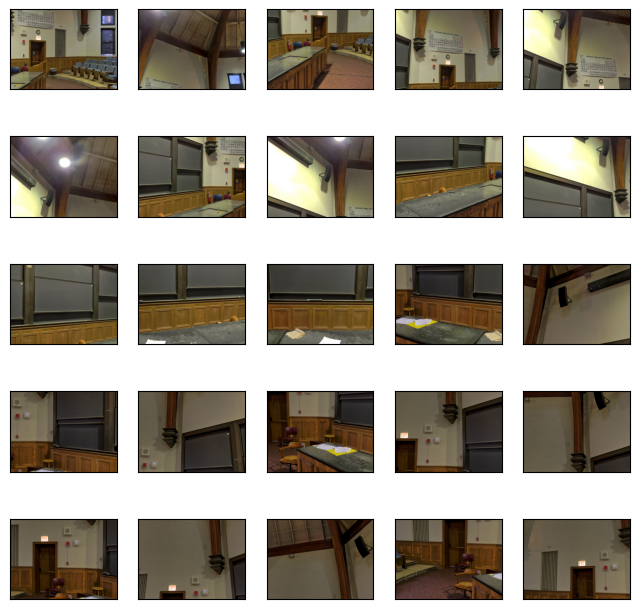

In [ ]:
# Plotting images

fig, ax = plt.subplots(nrows=5, ncols=5, figsize=(8,8))

k = 0

for i in range(5):
    for j in range(5):

        image_path = df.loc[k, 'image']

        with Image.open(image_path) as img:
            ax[i,j].imshow(img)

        ax[i,j].axes.yaxis.set_visible(False)
        ax[i,j].axes.xaxis.set_visible(False)

        k += 1

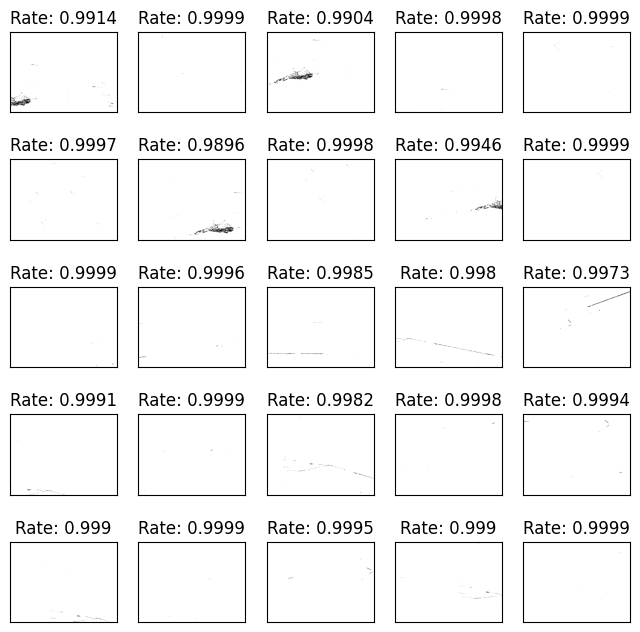

In [ ]:
# Plotting mask maps

fig, ax = plt.subplots(nrows=5, ncols=5, figsize=(8,8))

k = 0

for i in range(5):
    for j in range(5):

        mask_map_path = df.loc[k, 'mask']

        mask = np.load(mask_map_path)

        ax[i,j].imshow(mask, cmap='gray')

        ax[i,j].set_title(f'Rate: {round(np.sum(mask)/(768*1024),4)}')

        ax[i,j].axes.yaxis.set_visible(False)
        ax[i,j].axes.xaxis.set_visible(False)

        k += 1

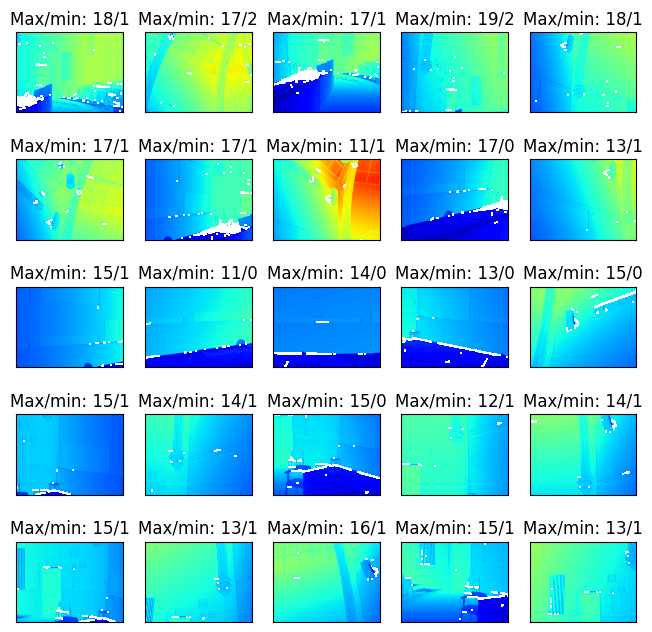

In [ ]:
# Plotting depth maps

fig, ax = plt.subplots(nrows=5, ncols=5, figsize=(8,8))

k = 0

for i in range(5):
    for j in range(5):

        depth_map_path = df.loc[k, 'depth']
        depth_map = np.load(depth_map_path).squeeze()

        mask_map_path = df.loc[k, 'mask']
        mask = np.load(mask_map_path)
        mask = mask > 0

        depth_map = np.ma.masked_where(~mask, depth_map)

        ax[i,j].imshow(depth_map, cmap='jet')

        ax[i,j].set_title(f'Max/min: {round(np.max(depth_map))}/{round(np.min(depth_map))}')

        ax[i,j].axes.yaxis.set_visible(False)
        ax[i,j].axes.xaxis.set_visible(False)

        k += 1

### Preparing hyperparameters

In [5]:
HEIGHT = 256
WIDTH = 256
LR = 0.0002
EPOCHS = 30
BATCH_SIZE = 32

### Building a data pipeline

1. The pipeline takes a dataframe containing the path for the RGB images,
as well as the depth and depth mask files.
2. It reads and resize the RGB images.
3. It reads the depth and depth mask files, process them to generate the depth map image and
resize it.
4. It returns the RGB images and the depth map images for a batch.

In [4]:

class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data, batch_size=6, dim=(768, 1024), n_channels=3, shuffle=True, **kwargs):
        """
        Initialization
        """
        self.data = data
        self.indices = self.data.index.tolist() #list of indices from the dataframe
        self.dim = dim
        self.n_channels = n_channels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.min_depth = 0.1
        self.on_epoch_end()

        super().__init__(**kwargs)

    def __len__(self): #Number of batch in the Sequence.
        return int(np.ceil(len(self.data) / self.batch_size))


    #__getitem__ should return whole batch not just one element as in Pytorch
    def __getitem__(self, index): #Gets batch at position index.
        if (index + 1) * self.batch_size > len(self.indices):
            self.batch_size = len(self.indices) - index * self.batch_size
        # Generate one batch of data
        # Generate indices of the batch
        index = self.indices[index * self.batch_size : (index + 1) * self.batch_size]
        # Find list of IDs
        batch = [self.indices[k] for k in index]
        x, y = self.data_generation(batch)

        return x, y

    def on_epoch_end(self): #Method called at the end of every epoch.

        """
        Updates indexes after each epoch
        """
        self.index = np.arange(len(self.indices))
        if self.shuffle == True:
            np.random.shuffle(self.index)

    def load(self, image_path, depth_map, mask):
        """Load input and target image."""

        image_ = cv2.imread(image_path)
        image_ = cv2.cvtColor(image_, cv2.COLOR_BGR2RGB) #reversing channels from Blue-Green-Red (BGR) to Red-Green-Blue (RGB)
        image_ = cv2.resize(image_, self.dim)
        image_ = tf.image.convert_image_dtype(image_, tf.float32) #Convert image to dtype, scaling its values if needed. Input data is normalized

        depth_map = np.load(depth_map).squeeze()

        mask = np.load(mask) #loading the npy files
        mask = mask > 0 # converting integer into boolean

        max_depth = min(300, np.percentile(depth_map, 99)) # remove very extreme values of depths

        depth_map = np.clip(depth_map, self.min_depth, max_depth) #Remove depths with very low or very high values

        depth_map = np.log(depth_map, #Take the targets to the log-space
                           where=mask #Log is computed only on pixels with mask True
                           )

        depth_map = np.ma.masked_where( # This function masks the values with invalid sensor measures
            condition=~mask,
            a=depth_map
            )

        depth_map = np.clip(depth_map, 0.1, np.log(max_depth)) # Clip again?

        depth_map = cv2.resize(depth_map, self.dim) #resize depth map
        depth_map = np.expand_dims(depth_map, axis=2)
        depth_map = tf.image.convert_image_dtype(depth_map, tf.float32)

        return image_, depth_map

    def data_generation(self, batch):

        x = np.empty((self.batch_size, *self.dim, self.n_channels), dtype=np.float32)
        y = np.empty((self.batch_size, *self.dim, 1), dtype=np.float32)

        for i, batch_id in enumerate(batch):
            x[i,], y[i,] = self.load(
                self.data["image"][batch_id],
                self.data["depth"][batch_id],
                self.data["mask"][batch_id],
            )

        return x, y


## Visualizing samples

In [6]:
def visualize_depth_map(samples, test=False, model=None):
    input, target = samples
    cmap = plt.cm.jet
    cmap.set_bad(color="black")

    if test:
        pred = model.predict(input)
        fig, ax = plt.subplots(6, 3, figsize=(20, 30))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)
            ax[i, 2].imshow((pred[i].squeeze()), cmap=cmap)

    else:
        fig, ax = plt.subplots(6, 2, figsize=(20, 30))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)


visualize_samples = next(
    iter(DataGenerator(data=df, batch_size=6, dim=(HEIGHT, WIDTH)))
)

In [ ]:
x, y = visualize_samples
print('x_shape', x.shape, x.dtype)
print('y_shape', y.shape, y.dtype)

x_shape (6, 256, 256, 3) float32
y_shape (6, 256, 256, 1) float32


CPU times: user 242 ms, sys: 14 ms, total: 256 ms
Wall time: 262 ms


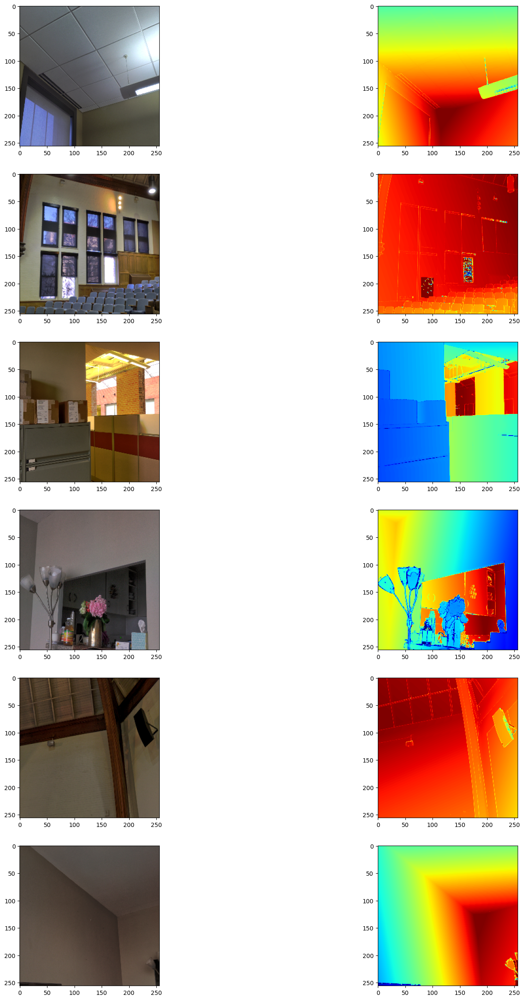

In [ ]:
%%time
visualize_depth_map(visualize_samples)

## 3D point cloud visualization

CPU times: user 16.2 s, sys: 336 ms, total: 16.6 s
Wall time: 16.3 s


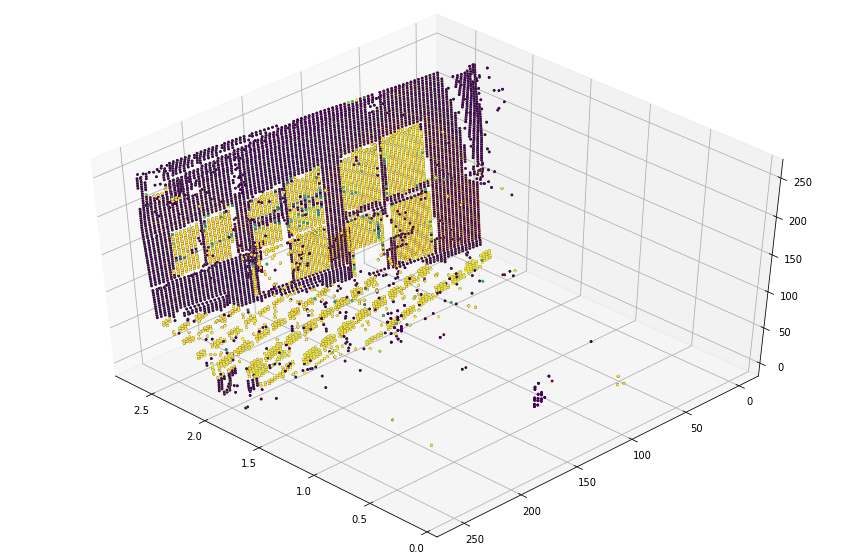

In [ ]:
%%time
depth_vis = np.flipud(visualize_samples[1][1].squeeze())  # target
img_vis = np.flipud(visualize_samples[0][1].squeeze())  # input

fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection="3d")

STEP = 3
for x in range(0, img_vis.shape[0], STEP):
    for y in range(0, img_vis.shape[1], STEP):
        ax.scatter(
            [depth_vis[x, y]] * 3,
            [y] * 3,
            [x] * 3,
            c=tuple(img_vis[x, y, :3] / 255),
            s=3,
        )
    ax.view_init(45, 135)

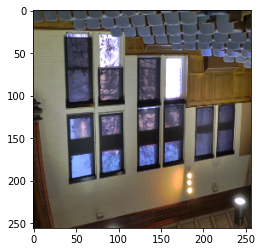

In [ ]:
plt.imshow(img_vis, cmap='gray')
plt.show()

## Building the model

1. The basic model is from U-Net.
2. Addditive skip-connections are implemented in the downscaling block.

In [7]:

class DownscaleBlock(tf.keras.layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.convA = tf.keras.layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = tf.keras.layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = tf.keras.layers.LeakyReLU(negative_slope=0.2) #type of activation function based on a ReLU, but it has a small slope for negative values instead of a flat slope
        self.reluB = tf.keras.layers.LeakyReLU(negative_slope=0.2)
        self.bn2a = tf.keras.layers.BatchNormalization()
        self.bn2b = tf.keras.layers.BatchNormalization()

        self.pool = tf.keras.layers.MaxPool2D((2, 2), (2, 2))

    def build(self, input_shape):
         super(DownscaleBlock, self).build(input_shape)

    def call(self, input_tensor):

        # First convolution, batch norm, and activation
        d = self.convA(input_tensor)
        x = self.bn2a(d)
        x = self.reluA(x)

        # Second convolution, batch norm, and activation
        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)

        # Residual connection
        x += d

        # Max pooling
        p = self.pool(x)

        # Return the output with residual connection and the pooled output
        return x, p

    def compute_output_shape(self, input_shape):
        x, p = self.call(tf.random.normal(input_shape))
        return x.shape

class UpscaleBlock(tf.keras.layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.us = tf.keras.layers.UpSampling2D((2, 2)) #UpSampling2D is just a simple scaling up of the image by using nearest neighbour or bilinear upsampling
        self.convA = tf.keras.layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = tf.keras.layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = tf.keras.layers.LeakyReLU(negative_slope=0.2)
        self.reluB = tf.keras.layers.LeakyReLU(negative_slope=0.2)
        self.bn2a = tf.keras.layers.BatchNormalization()
        self.bn2b = tf.keras.layers.BatchNormalization()
        self.conc = tf.keras.layers.Concatenate()

    def build(self, input_shape):
         super(UpscaleBlock, self).build(input_shape)

    def call(self, inputs):

        x, skip = inputs
        x = self.us(x)
        concat = self.conc([x, skip])
        x = self.convA(concat)
        x = self.bn2a(x)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)

        return x

    def compute_output_shape(self, input_shape):
        shape1, shape2 = input_shape
        x = self.call((tf.random.normal(shape1), tf.random.normal(shape2)))
        return x.shape


class BottleNeckBlock(tf.keras.layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.convA = tf.keras.layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = tf.keras.layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = tf.keras.layers.LeakyReLU(negative_slope=0.2)
        self.reluB = tf.keras.layers.LeakyReLU(negative_slope=0.2)
        self.bn2a = tf.keras.layers.BatchNormalization()
        self.bn2b = tf.keras.layers.BatchNormalization()

    def build(self, input_shape):
         super(BottleNeckBlock, self).build(input_shape)

    def call(self, x):
        x = self.convA(x)
        x = self.bn2a(x)
        x = self.reluA(x)
        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)
        return x

    def compute_output_shape(self, input_shape):
        x = self.call(tf.random.normal(input_shape))
        return x.shape


## Defining the loss

We will optimize 3 losses in our mode.
1. Structural Dissimilarity Index Measure (DSSIM).
2. L1-loss, or Point-wise depth in our case.
3. Depth smoothness loss.

Loss

\begin{align}
 L(y, \hat{y}) = \lambda_1 L_{\text{depth}}(y, \hat{y}) + \lambda_2 L_{\text{edge}}(y, \hat{y}) + \lambda_3 L_{SSIM}(y, \hat{y})
\end{align}

Point-wise L1 loss

\begin{align}
 L_{\text{depth}}(y, \hat{y}) = \frac{1}{n} \sum_{p}^{n} |y_p - \hat{y}_p|
\end{align}


DSSIM

\begin{align}
 L_{SSIM}(y, \hat{y}) = \frac{1 - \text{SSIM}(y, \hat{y})}{2}
\end{align}



Edge-Aware Depth Smoothness Loss

\begin{align}
 L_{\text{edge}}(y, \hat{y}) = \frac{1}{n} \sum_{p}^{n} \left|\frac{\partial \hat{y}_p}{\partial w} \right| e^{-\left|\frac{\partial y_p}{\partial w}\right|}+ \left|\frac{\partial \hat{y}_p}{\partial h} \right| e^{- \left|\frac{\partial y_p}{\partial h}\right|}
\end{align}


In [8]:
class DepthEstimationModel(tf.keras.Model):
    def __init__(self):
        super(DepthEstimationModel, self).__init__()

        self.ssim_loss_weight = 0.85
        self.l1_loss_weight = 0.1
        self.edge_loss_weight = 0.9
        self.loss_metric = tf.keras.metrics.Mean(name="loss")

        f = [16, 32, 64, 128, 256] #number of filters

        self.downscale_blocks = [
            DownscaleBlock(filters=f[0]),
            DownscaleBlock(filters=f[1]),
            DownscaleBlock(filters=f[2]),
            DownscaleBlock(filters=f[3]),
        ]
        self.bottle_neck_block = BottleNeckBlock(filters=f[4])
        self.upscale_blocks = [
            UpscaleBlock(filters=f[3]),
            UpscaleBlock(filters=f[2]),
            UpscaleBlock(filters=f[1]),
            UpscaleBlock(filters=f[0]),
        ]

        self.conv_layer = tf.keras.layers.Conv2D(1, (1, 1), padding="same", activation="relu")

    def build(self, input_shape):
        # self.call(tf.random.normal(input_shape))
        super(DepthEstimationModel, self).build(input_shape)

        # self.built = True

    def calculate_loss(self, target, pred):

        # Edge Loss

        #An image gradient is a directional change in the intensity or color in an image
        dy_true, dx_true = tf.image.image_gradients(target)
        dy_pred, dx_pred = tf.image.image_gradients(pred)

        weights_x = tf.exp(-tf.abs(dx_true))
        weights_y = tf.exp(-tf.abs(dy_true))

        # # Depth smoothness}

        smoothness_x = tf.abs(dx_pred) * weights_x
        smoothness_y = tf.abs(dy_pred) * weights_y

        depth_smoothness_loss = tf.reduce_mean(smoothness_x) + tf.reduce_mean(smoothness_y)

        # depth_smoothness_loss = tf.reduce_mean(tf.abs(dy_pred - dy_true) + tf.abs(dx_pred - dx_true))

        # Structural similarity (SSIM) index
        #Compares the similarity of two images, taking into account their luminance, contrast, and structure.
        ssim_loss = (1 - tf.image.ssim(
            target, pred,
            max_val=WIDTH, # The dynamic range of the images
            filter_size=7, # Size of gaussian filter
            k1=0.01 ** 2,
            k2=0.03 ** 2
            )
        ) * 0.5

        # Point-wise depth
        l1_loss = tf.reduce_mean(tf.abs(target - pred))

        # Total loss
        loss = (
            (self.ssim_loss_weight * ssim_loss)
            + (self.l1_loss_weight * l1_loss)
            + (self.edge_loss_weight * depth_smoothness_loss)
        )

        return loss

    @property
    def metrics(self):
        return [self.loss_metric]

    def train_step(self, batch_data):
        input, target = batch_data
        with tf.GradientTape() as tape:
            pred = self(input, training=True)
            loss = self.calculate_loss(target, pred)

        gradients = tape.gradient(loss, self.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
        self.loss_metric.update_state(loss)

        return {
            "loss": self.loss_metric.result(),
        }

    def test_step(self, batch_data):
        input, target = batch_data

        pred = self(input, training=False)
        loss = self.calculate_loss(target, pred)

        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def call(self, input_tensor):

        c1, p1 = self.downscale_blocks[0](input_tensor)
        c2, p2 = self.downscale_blocks[1](p1)
        c3, p3 = self.downscale_blocks[2](p2)
        c4, p4 = self.downscale_blocks[3](p3)

        bn = self.bottle_neck_block(p4)

        u1 = self.upscale_blocks[0]((bn, c4))
        u2 = self.upscale_blocks[1]((u1, c3))
        u3 = self.upscale_blocks[2]((u2, c2))
        u4 = self.upscale_blocks[3]((u3, c1))

        return self.conv_layer(u4)

In [20]:
model_1 = DepthEstimationModel()

In [ ]:
# model_1.build((6, 256, 256, 3))
pred = model_1(tf.random.normal((6, 256, 256, 3)))

In [22]:
model_1.summary()

Model: "depth_estimation_model_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ downscale_block_4 (DownscaleBlock)   │ (6, 256, 256, 16)           │           2,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ downscale_block_5 (DownscaleBlock)   │ (6, 128, 128, 32)           │          14,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ downscale_block_6 (DownscaleBlock)   │ (6, 64, 64, 64)             │          55,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ downscale_block_7 (DownscaleBlock)   │ (6, 32, 32, 128)            │         222,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bottle_neck_block_1                  │ (6, 16, 16, 256)            │         887,296 │
│ (BottleNeckBlock)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ upscale_block_4 (UpscaleBlock)       │ (6, 32, 32, 128)            │         591,104 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ upscale_block_5 (UpscaleBlock)       │ (6, 64, 64, 64)             │         148,096 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ upscale_block_6 (UpscaleBlock)       │ (6, 128, 128, 32)           │          37,184 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ upscale_block_7 (UpscaleBlock)       │ (6, 256, 256, 16)           │           9,376 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_37 (Conv2D)                   │ (6, 256, 256, 1)            │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,968,513 (7.51 MB)

 Trainable params: 1,965,569 (7.50 MB)

 Non-trainable params: 2,944 (11.50 KB)

## Model training

In [23]:
LR = 0.0001
EPOCHS = 30
BATCH_SIZE = 6

In [24]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=LR,
    decay_steps=100,
    decay_rate=0.97,
    staircase=True
)

In [25]:
# Optimizer

optimizer = tf.keras.optimizers.Adam(
    learning_rate=lr_schedule,
    amsgrad=True, # AMSGrad variant of the Adam optimizer introduced to help to stabilize the learning process in certain cases
    # clipnorm=1
    clipvalue=1
)

# Compile the model
model_1.compile(optimizer)

# Training with the first 260 images
train_loader = DataGenerator(
    data=df[:260].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
validation_loader = DataGenerator(
    data=df[260:].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)

checkpoint_path = "./checkpoints/model_1/cp-{epoch:04d}.weights.h5"

checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, save_weights_only=True)

# Define the TerminateOnNaN callback
terminate_on_nan = tf.keras.callbacks.TerminateOnNaN()

In [26]:
%%time
# Training
history = model_1.fit(
    train_loader,
    epochs=EPOCHS,
    validation_data=validation_loader,
    callbacks=[checkpoint, terminate_on_nan]
)

Epoch 1/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 45s 513ms/step - loss: 0.3967 - val_loss: nan
Epoch 2/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 12s 251ms/step - loss: 0.2081 - val_loss: 0.1888
Epoch 3/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 12s 254ms/step - loss: 0.1586 - val_loss: 0.1879
Epoch 4/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 21s 278ms/step - loss: 0.1736 - val_loss: 0.1844
Epoch 5/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 10s 214ms/step - loss: 0.1481 - val_loss: 0.1717
Epoch 6/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 14s 301ms/step - loss: 0.1599 - val_loss: nan
Epoch 7/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 18s 237ms/step - loss: 0.1556 - val_loss: 0.1628
Epoch 8/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 21s 248ms/step - loss: 0.1438 - val_loss: 0.1626
Epoch 9/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 11s 231ms/step - loss: 0.1249 - val_loss: 0.1662
Epoch 10/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 10s 218ms/step - loss: 0.1251 - val_loss: 0.1624
Epoch 11/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 20s 209ms/step - loss: 0.1310 - val_loss: 0.1616
Epoch 12/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 12s 251m

In [27]:
model_1.load_weights("./checkpoints/model_1/cp-0025.weights.h5")

In [28]:
x, y = visualize_samples
pred = model_1.predict(x)
print('x', x.shape, x.dtype)
print('y', y.shape, y.dtype)
print('pred', pred.shape, pred.dtype)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
x (6, 256, 256, 3) float32
y (6, 256, 256, 1) float32
pred (6, 256, 256, 1) float32


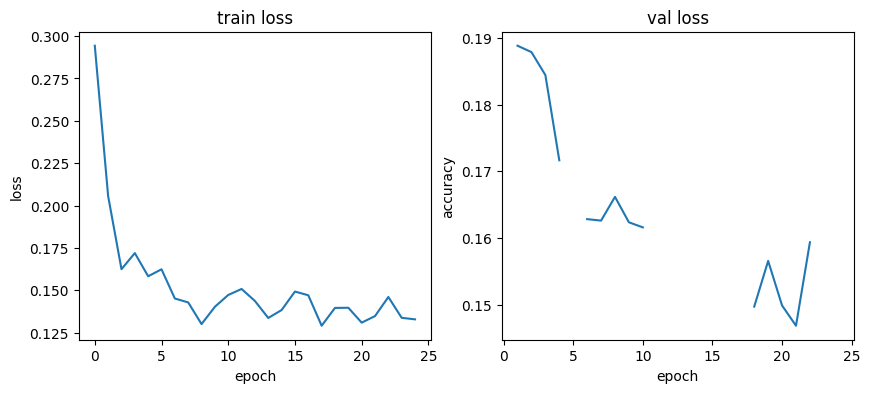

In [29]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

axes[0].plot(history.history['loss'])
axes[0].set_title('train loss')
axes[0].set_xlabel('epoch')
axes[0].set_ylabel('loss')

axes[1].plot(history.history['val_loss'])
axes[1].set_title('val loss')
axes[1].set_xlabel('epoch')
axes[1].set_ylabel('accuracy')

plt.show()

## Visualizing model output

We visualize the model output over the validation set.
The first image is the RGB image, the second image is the ground truth depth map image
and the third one is the predicted depth map image.

In [30]:

test_loader1 = next(
    iter(
        DataGenerator(
            data=df[265:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)

test_loader2 = next(
    iter(
        DataGenerator(
            data=df[300:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
CPU times: user 356 ms, sys: 16.5 ms, total: 373 ms
Wall time: 398 ms


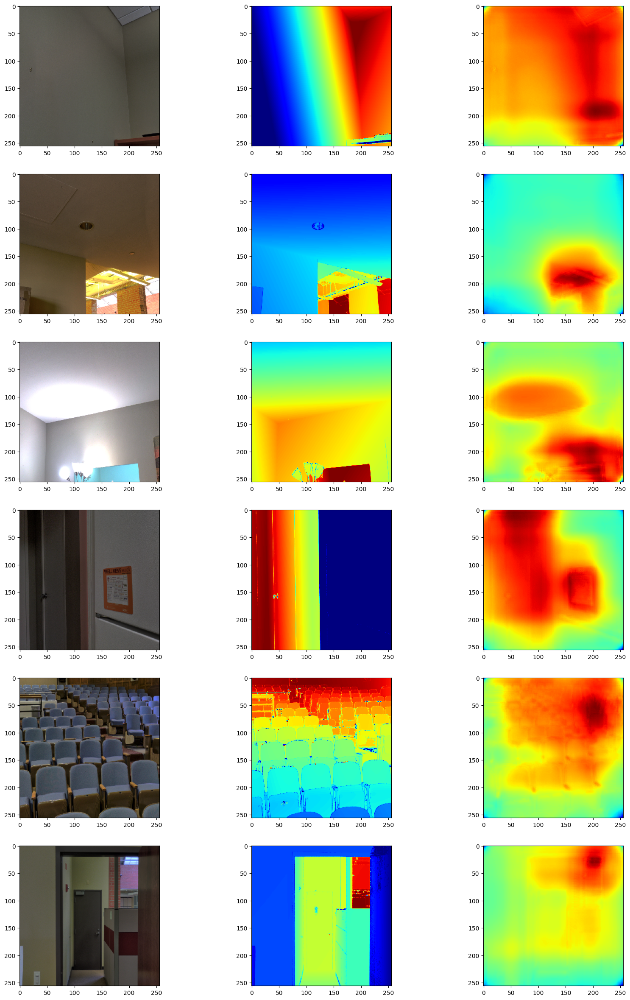

In [31]:
%%time
visualize_depth_map(test_loader1, test=True, model=model_1)
# visualize_depth_map(test_loader2, test=True, model=model)

## Scale-invariant mean-squared error loss

The scale-invariant mean-squared error is computed in log-space as:

\begin{align}
 L(y, \hat{y}) = \frac{1}{n} \sum_{p}^{n} \left(\log y_p  - \log \hat{y}_p + \alpha (y, \hat{y})\right)^2
\end{align}

where

\begin{align}
 \alpha (y, \hat{y}) = \frac{1}{n} \sum_{p}^{n} \left(\log y_p  - \log \hat{y}_p\right)
\end{align}

In [57]:
class DepthEstimationModel_mod(DepthEstimationModel):

    def calculate_loss(self, target, pred):

        #Scale-invariant mean-squared error

        # pred = (1 + pred)/2 # to take the tahn values from (-1,1) to (0,1) and avoid invalid operation in the log space

        pred = tf.math.log(pred + 1e-6) #taking output to the log space

        alpha = tf.reduce_mean(target - pred)

        loss = tf.reduce_mean(tf.math.square(pred - target - alpha))

        return loss


In [58]:
model_2 = DepthEstimationModel_mod()

In [36]:
# model_2.build((1, 256, 256, 3))
pred = model_2(tf.random.normal((6, 256, 256, 3)))

In [37]:
model_2.summary()

Model: "depth_estimation_model_mod"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ downscale_block_8 (DownscaleBlock)   │ (6, 256, 256, 16)           │           2,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ downscale_block_9 (DownscaleBlock)   │ (6, 128, 128, 32)           │          14,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ downscale_block_10 (DownscaleBlock)  │ (6, 64, 64, 64)             │          55,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ downscale_block_11 (DownscaleBlock)  │ (6, 32, 32, 128)            │         222,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bottle_neck_block_2                  │ (6, 16, 16, 256)            │         887,296 │
│ (BottleNeckBlock)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ upscale_block_8 (UpscaleBlock)       │ (6, 32, 32, 128)            │         591,104 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ upscale_block_9 (UpscaleBlock)       │ (6, 64, 64, 64)             │         148,096 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ upscale_block_10 (UpscaleBlock)      │ (6, 128, 128, 32)           │          37,184 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ upscale_block_11 (UpscaleBlock)      │ (6, 256, 256, 16)           │           9,376 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_56 (Conv2D)                   │ (6, 256, 256, 1)            │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,968,513 (7.51 MB)

 Trainable params: 1,965,569 (7.50 MB)

 Non-trainable params: 2,944 (11.50 KB)

In [54]:
LR = 0.0001
EPOCHS = 30
BATCH_SIZE = 6

In [53]:
# Scheduler
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=LR,
    decay_steps=100,
    decay_rate=0.97,
    staircase=True
)

In [59]:
optimizer = tf.keras.optimizers.Adam(
    learning_rate=lr_schedule,
    amsgrad=False,
    clipvalue=1 #add clipping to avoid exploding or vanishing gradients
)


# Compile the model
model_2.compile(optimizer)

train_loader = DataGenerator(
    data=df[:260].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
validation_loader = DataGenerator(
    data=df[260:].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)

checkpoint_path = "./checkpoints/model_2/cp-{epoch:04d}.weights.h5"

checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, save_weights_only=True)

# Define the TerminateOnNaN callback
terminate_on_nan = tf.keras.callbacks.TerminateOnNaN()

In [60]:
%%time
history = model_2.fit(
    train_loader,
    epochs=30,
    validation_data=validation_loader,
    callbacks=[checkpoint, terminate_on_nan]
)

Epoch 1/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 44s 502ms/step - loss: 10.8870 - val_loss: 1.0883
Epoch 2/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 21s 241ms/step - loss: 1.5430 - val_loss: 1.6299
Epoch 3/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 12s 254ms/step - loss: 1.5650 - val_loss: 1.1813
Epoch 4/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 26s 386ms/step - loss: 1.5991 - val_loss: 1.0893
Epoch 5/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.9140 - val_loss: 1.0403
Epoch 6/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 12s 248ms/step - loss: 1.0900 - val_loss: 1.3124
Epoch 7/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - loss: 1.0651 - val_loss: 1.0574
Epoch 8/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 22s 278ms/step - loss: 1.4047 - val_loss: 1.6965
Epoch 9/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 10s 216ms/step - loss: 1.1382 - val_loss: 0.9291
Epoch 10/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 10s 208ms/step - loss: 1.1890 - val_loss: 0.7989
Epoch 11/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 12s 262ms/step - loss: 0.7081 - val_loss: 0.8916
Epoch 12/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 1

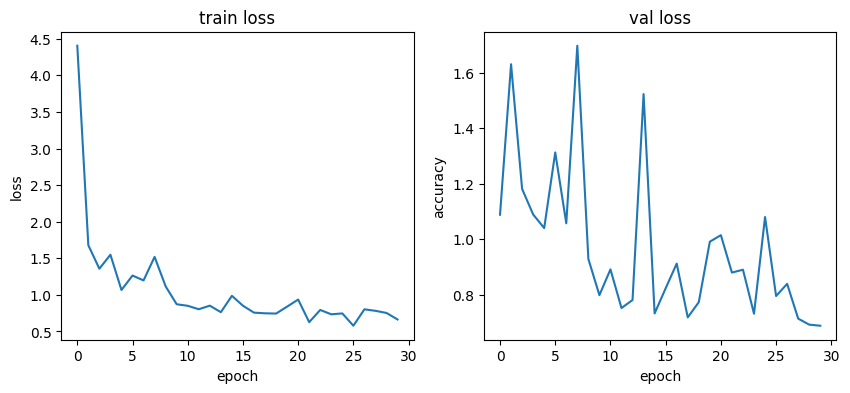

In [61]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

axes[0].plot(history.history['loss'])
axes[0].set_title('train loss')
axes[0].set_xlabel('epoch')
axes[0].set_ylabel('loss')

axes[1].plot(history.history['val_loss'])
axes[1].set_title('val loss')
axes[1].set_xlabel('epoch')
axes[1].set_ylabel('accuracy')

plt.show()

In [42]:
model_2.load_weights("./checkpoints/model_2/cp-0011.weights.h5")

In [ ]:
weights = model_2.get_weights()
for i, w in enumerate(weights):
    print("Layer {}: max {:.2e} min {:.2e}".format(i, np.max(w),np.min(w)))

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
CPU times: user 1.44 s, sys: 42.7 ms, total: 1.48 s
Wall time: 1.6 s


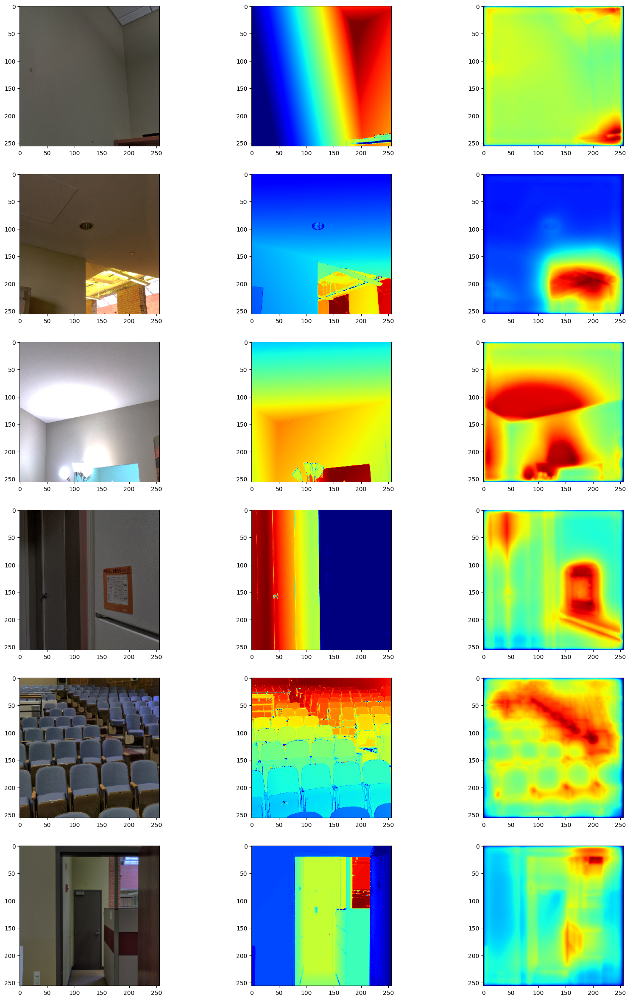

In [62]:
%%time
visualize_depth_map(test_loader1, test=True, model=model_2)
# visualize_depth_map(test_loader2, test=True, model=model_2)

## DenseNet

In [44]:
HEIGHT = 256
WIDTH = 256
LR = 0.0001
EPOCHS = 30
BATCH_SIZE = 6

In [45]:
#Loding DenseNet121
DenseNet = tf.keras.applications.DenseNet121(
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    input_shape=(HEIGHT, WIDTH, 3),
    pooling=None
)

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [46]:
DenseNet.summary()

Model: "densenet121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 262, 262, 3)    │              0 │ input_layer[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 128, 128, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 128, 128, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 128, 128, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 130, 130, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 64, 64, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 64, 64, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 64, 64, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 64, 64, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 64, 64, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 64, 64, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 64, 64, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block2_0_bn    

 Total params: 7,037,504 (26.85 MB)

 Trainable params: 6,953,856 (26.53 MB)

 Non-trainable params: 83,648 (326.75 KB)

In [47]:
def DenseNet_mod(DenseNet):
  inputs = DenseNet.input

  x1 = DenseNet.get_layer('relu').output #(None, 8, 8, 1024)
  x2 = DenseNet.get_layer('pool4_conv').output #(None, 16, 16, 512)
  x3 = DenseNet.get_layer('pool3_conv').output #(None, 32, 32, 256)
  x4 = DenseNet.get_layer('pool2_conv').output #(None, 64, 64, 128)
  x5 = DenseNet.get_layer('conv1_relu').output #(None, 128, 128, 64)

  u = tf.keras.layers.Conv2DTranspose(filters=512,kernel_size=(2,2),activation='relu',padding='same',strides=2)(x1)
  x = tf.keras.layers.Concatenate()([u,x2])
  x = tf.keras.layers.Conv2D(filters=256,kernel_size=(2,2),activation='relu',padding='same',strides=1)(x)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.LeakyReLU(negative_slope=0.2)(x)

  u = tf.keras.layers.Conv2DTranspose(filters=256,kernel_size=(2,2),activation='relu',padding='same',strides=2)(x)
  x = tf.keras.layers.Concatenate()([u,x3])
  x = tf.keras.layers.Conv2D(filters=128,kernel_size=(2,2),activation='relu',padding='same',strides=1)(x)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.LeakyReLU(negative_slope=0.2)(x)

  u = tf.keras.layers.Conv2DTranspose(filters=128,kernel_size=(2,2),activation='relu',padding='same',strides=2)(x)
  x = tf.keras.layers.Concatenate()([u,x4])
  x = tf.keras.layers.Conv2D(filters=64,kernel_size=(2,2),activation='relu',padding='same',strides=1)(x)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.LeakyReLU(negative_slope=0.2)(x)

  u = tf.keras.layers.Conv2DTranspose(filters=64,kernel_size=(2,2),activation='relu',padding='same',strides=2)(x)
  x = tf.keras.layers.Concatenate()([u,x5])
  x = tf.keras.layers.Conv2D(filters=32,kernel_size=(2,2),activation='relu',padding='same',strides=1)(x)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.LeakyReLU(negative_slope=0.2)(x)

  x = tf.keras.layers.Conv2DTranspose(filters=32,kernel_size=(2,2),activation='relu',padding='same',strides=2)(x)
  x = tf.keras.layers.Conv2D(1, (1, 1), activation='relu')(x)

  # Create the final model
  model = tf.keras.models.Model(inputs=inputs, outputs=x)

  return model

In [48]:
model_3 = DenseNet_mod(DenseNet)

In [49]:
model_3.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 262, 262, 3)    │              0 │ input_layer[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 128, 128, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 128, 128, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 128, 128, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 130, 130, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 64, 64, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 64, 64, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 64, 64, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 64, 64, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 64, 64, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 64, 64, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 64, 64, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block2_0_bn    

 Total params: 10,878,881 (41.50 MB)

 Trainable params: 10,794,273 (41.18 MB)

 Non-trainable params: 84,608 (330.50 KB)

In [63]:
@tf.function
def scale_invariant(target, pred):

    target = tf.cast(target, tf.float32)
    pred = tf.cast(pred, tf.float32)

    #Scale-invariant mean-squared error

    # pred = (1 + pred)/2 # to take the tahn values from (-1,1) to (0,1) and avoid invalid operation in the log space

    pred = tf.math.log(pred + 1e-6) #taking output to the log space

    alpha = tf.reduce_mean(target - pred)

    loss = tf.reduce_mean(tf.math.square(pred - target - alpha))

    return loss

In [64]:
model_3 = DenseNet_mod(DenseNet)

In [65]:
%%time
optimizer = tf.keras.optimizers.Adam(
    learning_rate=LR,
    amsgrad=True, #improve convergence
    clipnorm=1
)

# Compile the model
model_3.compile(optimizer, loss=scale_invariant)

train_loader = DataGenerator(
    data=df[:260].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
validation_loader = DataGenerator(
    data=df[260:].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)

checkpoint_path = "./checkpoints/model_3/cp-{epoch:04d}.weights.h5"

checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, save_weights_only=True)

CPU times: user 10.5 ms, sys: 0 ns, total: 10.5 ms
Wall time: 9.84 ms


In [66]:
%%time
history = model_3.fit(
    train_loader,
    epochs=EPOCHS,
    validation_data=validation_loader,
    callbacks=[checkpoint, terminate_on_nan]
)

Epoch 1/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 433s 4s/step - loss: 355.5874 - val_loss: 69.7368
Epoch 2/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 16s 347ms/step - loss: 168.1591 - val_loss: 45.4648
Epoch 3/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 16s 353ms/step - loss: 68.5329 - val_loss: 32.8904
Epoch 4/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 19s 318ms/step - loss: 27.9030 - val_loss: 23.1805
Epoch 5/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 16s 346ms/step - loss: 13.8232 - val_loss: 13.7026
Epoch 6/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 20s 319ms/step - loss: 8.9513 - val_loss: 6.5072
Epoch 7/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 16s 342ms/step - loss: 4.8387 - val_loss: 3.6740
Epoch 8/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 14s 303ms/step - loss: 3.8912 - val_loss: 1.7006
Epoch 9/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 20s 291ms/step - loss: 2.1769 - val_loss: 1.0567
Epoch 10/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 20s 289ms/step - loss: 1.7097 - val_loss: 0.9033
Epoch 11/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 21s 289ms/step - loss: 1.1056 - val_loss: 0.7444
Epoch 12/30
44/44 ━━━━━━━━━━━━━

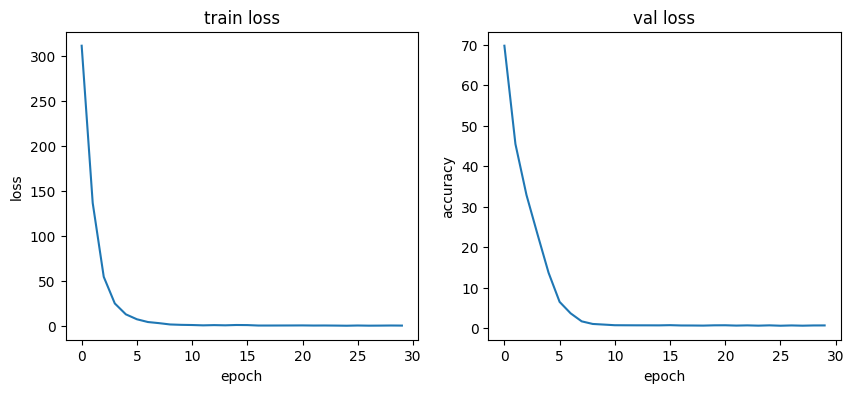

In [67]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

axes[0].plot(history.history['loss'])
axes[0].set_title('train loss')
axes[0].set_xlabel('epoch')
axes[0].set_ylabel('loss')

axes[1].plot(history.history['val_loss'])
axes[1].set_title('val loss')
axes[1].set_xlabel('epoch')
axes[1].set_ylabel('accuracy')

plt.show()

In [ ]:
model_3.load_weights("./checkpoints/model_3/cp-0020.weights.h5")

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
CPU times: user 9.82 s, sys: 255 ms, total: 10.1 s
Wall time: 12.7 s


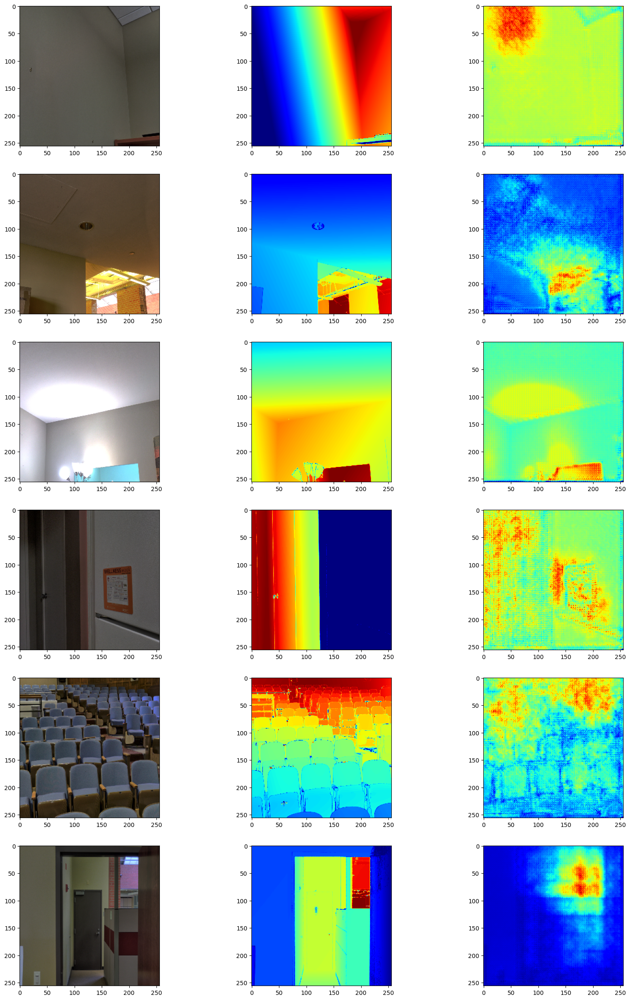

In [68]:
%%time
visualize_depth_map(test_loader1, test=True, model=model_3)
# visualize_depth_map(test_loader2, test=True, model=model_3)

DenseNet is missing resolution